In [1]:
import numpy as np
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.feature_selection import f_classif
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import kendalltau

#### Load Data

In [2]:
raw_data = pd.read_csv('df_client.csv')
data = raw_data.copy()

#### remove rows with all missing value in Variable columns

In [3]:
data_cleaned = data.dropna(subset= data.columns[6:124],how='all')

#### remove the extreme outlier 

In [5]:
#Drop variables without the range of two sd from mean as extreme outliers
mean_variables = np.asarray(data_cleaned.iloc[:,6:].mean())
sd_variables = np.asarray(data_cleaned.iloc[:,6:].std())

#remove the outliers
data_removed = data_cleaned.iloc[(~(np.abs(data_cleaned.iloc[:,6:] - mean_variables) > sd_variables * 2).any(axis=1)).to_list(),:]

#### fitting the missing data

In [6]:
data_fitting = data_removed.copy()

# 1. drop columns with more than 20% missing data, and then drop any rows with missing data
data_fit1 = data_fitting.loc[:, data_fitting.isna().mean() < 0.2].dropna().copy()

# 2. fitting the data by mean
column_mean = data_fitting.mean()
data_fit2 =data_fitting.fillna(column_mean)

# 3. fitting the data by median
column_median = data_fitting.median()
data_fit3 =data_fitting.fillna(column_median)

# 4. impute the missing data using regression
# Similarly, to have the regression work well, the filtered original data was used to run the regression
data_fit4 = data_fitting.copy()
reg_imp = IterativeImputer(max_iter=20, random_state=0, verbose=2)
reg_imp.fit(data_fit4.iloc[:,6:])
data_fit4.iloc[:,6:] = reg_imp.transform(data_fit4.iloc[:,6:])

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\1960687685.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  column_mean = data_fitting.mean()
C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\1960687685.py:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  column_median = data_fitting.median()


[IterativeImputer] Completing matrix with shape (21981, 118)
[IterativeImputer] Ending imputation round 1/20, elapsed time 17.80
[IterativeImputer] Change: 2475528125.605253, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 2/20, elapsed time 35.60
[IterativeImputer] Change: 787309330.1323024, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 3/20, elapsed time 53.46
[IterativeImputer] Change: 539164706.0429677, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 4/20, elapsed time 70.96
[IterativeImputer] Change: 443272991.5301797, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 5/20, elapsed time 87.71
[IterativeImputer] Change: 283374887.8794371, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 6/20, elapsed time 105.48
[IterativeImputer] Change: 185103815.43423417, scaled tolerance: 1050623.067 
[IterativeImputer] Ending imputation round 7/20, elapsed time 122.0

C:\Users\a9958\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


[IterativeImputer] Ending imputation round 1/20, elapsed time 1.58
[IterativeImputer] Ending imputation round 2/20, elapsed time 3.16
[IterativeImputer] Ending imputation round 3/20, elapsed time 4.75
[IterativeImputer] Ending imputation round 4/20, elapsed time 6.31
[IterativeImputer] Ending imputation round 5/20, elapsed time 7.87
[IterativeImputer] Ending imputation round 6/20, elapsed time 9.42
[IterativeImputer] Ending imputation round 7/20, elapsed time 10.96
[IterativeImputer] Ending imputation round 8/20, elapsed time 12.51
[IterativeImputer] Ending imputation round 9/20, elapsed time 14.04
[IterativeImputer] Ending imputation round 10/20, elapsed time 15.61
[IterativeImputer] Ending imputation round 11/20, elapsed time 17.21
[IterativeImputer] Ending imputation round 12/20, elapsed time 18.80
[IterativeImputer] Ending imputation round 13/20, elapsed time 20.39
[IterativeImputer] Ending imputation round 14/20, elapsed time 21.94
[IterativeImputer] Ending imputation round 15/20,

In [25]:
#Check the correlation with between years in each variable
def Corr_By_year(df):
    cmap = sns.diverging_palette(10, 245, as_cmap=True)
    fig, axs = plt.subplots(5, 6, figsize = (24,21))

    for i in range(30):
        cols = list(filter(lambda x: x.startswith(f'Variable_{i+1}_'), df.columns))
        axs[i//6][i%6].set_title(f"Variable_{i+1}")
        if len(cols) > 0:
            sns.heatmap(data=df[cols].corr(), cmap=cmap,ax=axs[i//6][i%6], annot=True, vmin=-1, vmax=1,
                        xticklabels=False, yticklabels=False, square=True, cbar=False)

    fig.colorbar(axs[1][0].get_children()[0], ax=axs.ravel().tolist(), aspect=100, 
                 location="top", orientation="horizontal", anchor=(0.5, 1.5))
    fig.suptitle("Correlation between years of each variable", fontsize=40)
    fig.tight_layout()
    fig.subplots_adjust(top = 0.9)

    plt.show()

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3707584011.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


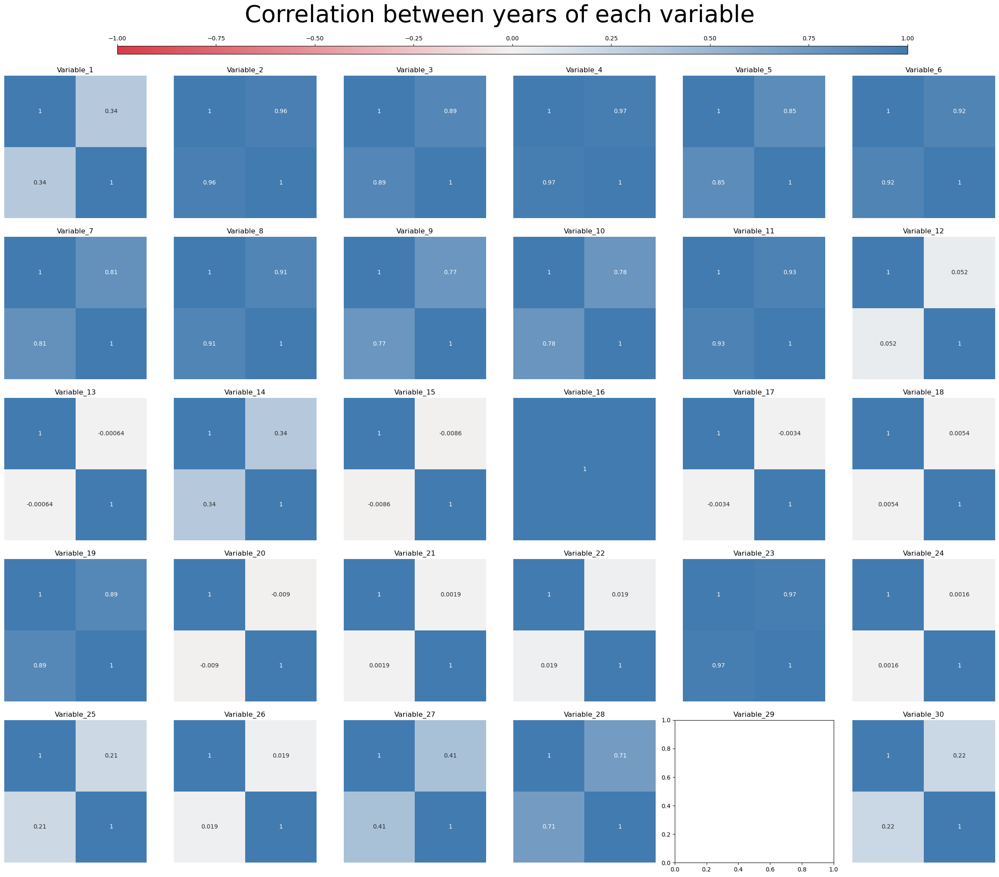

In [26]:
Corr_By_year(data_fit1)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3707584011.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


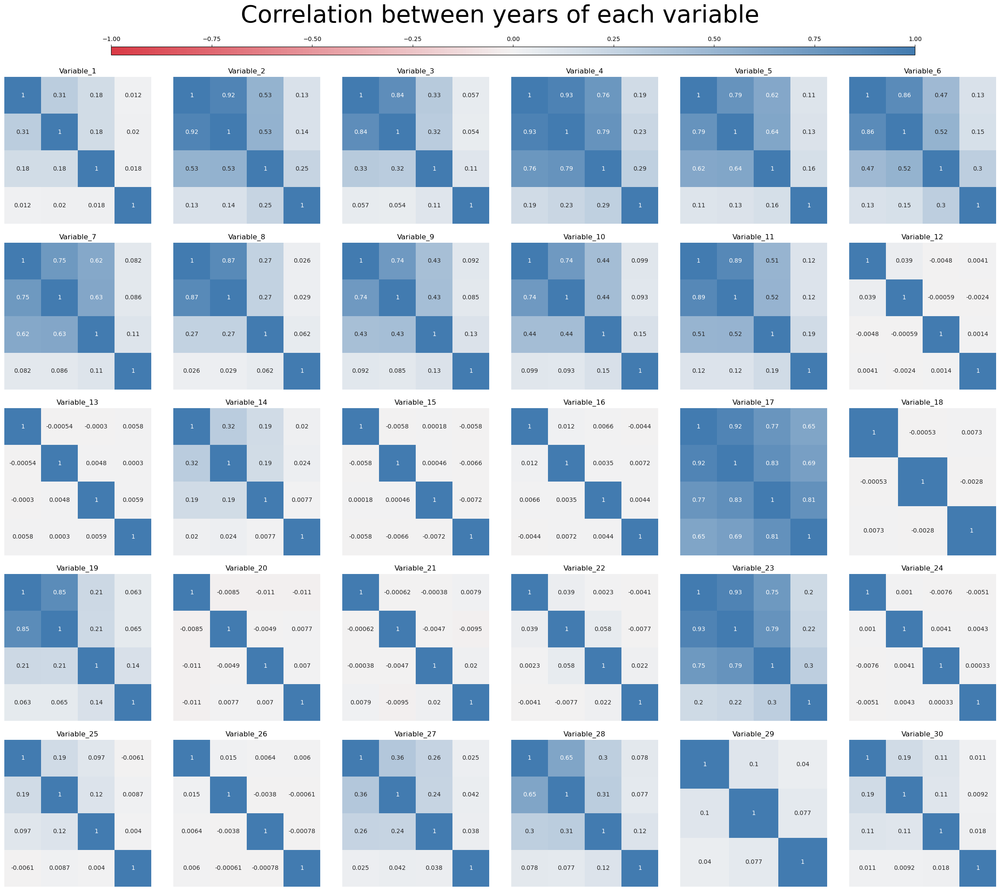

In [27]:
Corr_By_year(data_fit2)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3707584011.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


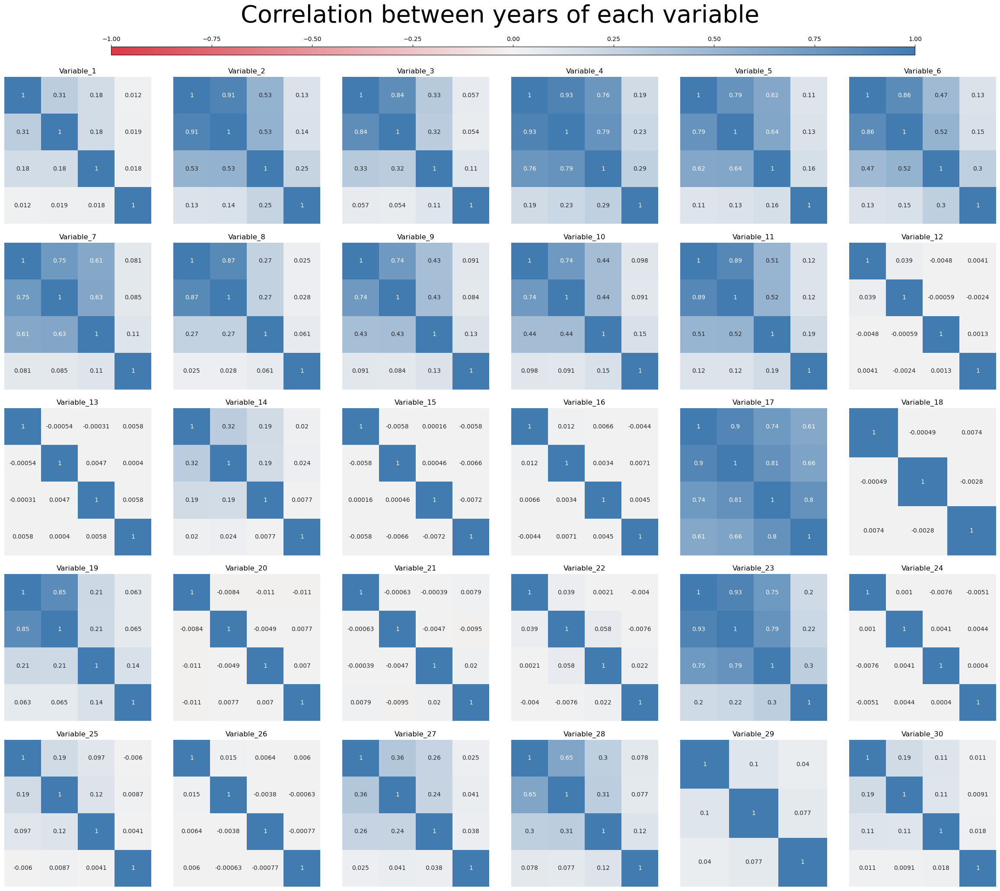

In [28]:
Corr_By_year(data_fit3)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3707584011.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


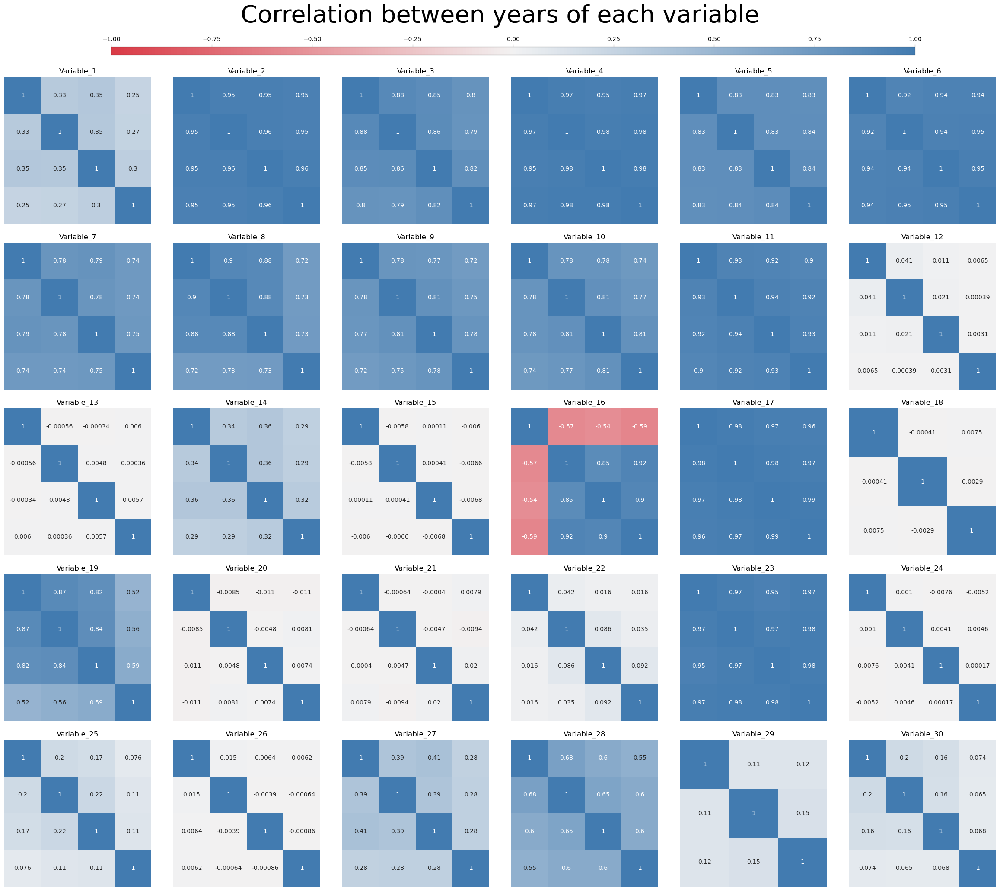

In [29]:
Corr_By_year(data_fit4)

In [30]:
#Check the correlation between each variable in each year
def Corr_By_Variable(df):
    max_year_index = max([int(col[-1]) for col in filter(lambda x: x.startswith("Variable_"), df.columns)])
    cmap = sns.diverging_palette(10, 245, as_cmap=True)
    fig, axs = plt.subplots(max_year_index+1, 1, figsize = (20,20*(max_year_index+1)))

    for i in range(max_year_index + 1):
        cols = list(filter(lambda x: x.endswith(f'_Y{i}'), df.columns))
        axs[i].set_title(f"Y{i}")
        sns.heatmap(data=df[cols].corr(), ax=axs[i], cmap=cmap, annot=True, vmin=-1, vmax=1,
                    square=True, cbar=False)

    fig.colorbar(axs[0].get_children()[0], ax=axs.ravel().tolist(), aspect=100, 
                 location="top", orientation="horizontal", anchor=(0.5, 1.57+0.05*(max_year_index+1)))
    fig.suptitle("Correlation between variables in each year", fontsize=40)
    fig.tight_layout()
    fig.subplots_adjust(top=0.918+0.01*(max_year_index+1))

    plt.show()

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3166628098.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


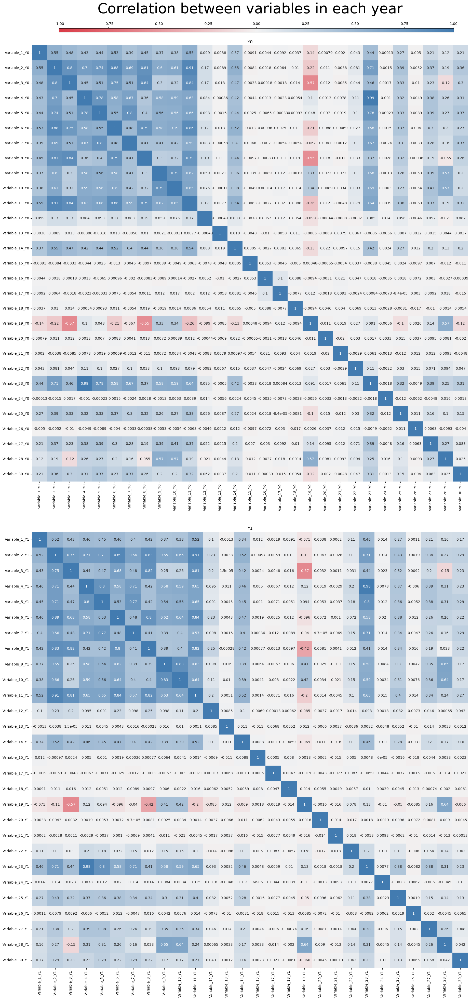

In [31]:
Corr_By_Variable(data_fit1)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3166628098.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


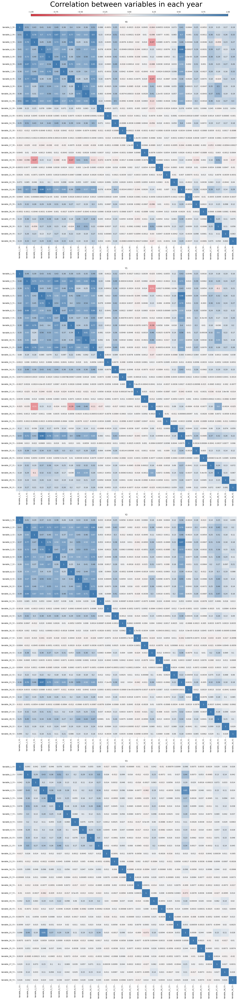

In [32]:
Corr_By_Variable(data_fit2)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3166628098.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


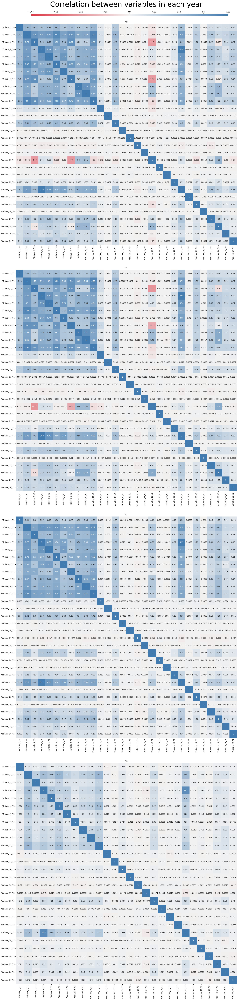

In [33]:
Corr_By_Variable(data_fit3)

C:\Users\a9958\AppData\Local\Temp\ipykernel_13020\3166628098.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


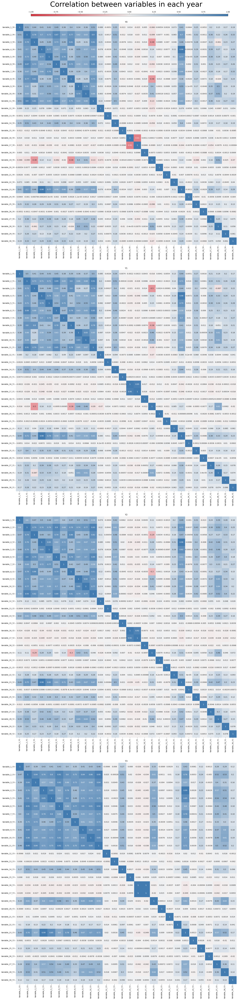

In [34]:
Corr_By_Variable(data_fit4)

In [35]:
#check point
data_1 = data_fit1.copy()
data_2 = data_fit2.copy() 
data_3 = data_fit3.copy()
data_4 = data_fit4.copy()

In [36]:
#pick up variables which has high correlation with other variables 
#or high correlation between years in single variable.
high_corr_Yr = [2,3,4,5,6,7,8,9,10,11,16,17,19,23,28]
high_corr_cols = [4, 5, 6, 7, 8, 10, 11, 17, 23, 28]

#Drop these variables
def drop_high_corr_col(df):
    drop_cols = list(filter(lambda x: x.startswith("Variable") and int(x.split("_")[1]) in high_corr_Yr and not x.endswith("Y0"), df.columns))
    drop_cols.extend(list(filter(lambda x: x.startswith("Variable") and int(x.split("_")[1]) in high_corr_cols and x not in drop_cols, df.columns)))  
    return df.drop(columns=drop_cols)



In [37]:
#remove the columns
train_1=drop_high_corr_col(data_1)
train_2=drop_high_corr_col(data_2)
train_3=drop_high_corr_col(data_3)
train_4=drop_high_corr_col(data_4)

In [38]:
#Using ANOVA and Kendall to find the significant variables in 0.05 level
significant_level = 0.05
def check_anova(df, features, target="risk_rating"):
    return np.array(df.columns[6:])[f_classif(df.loc[:,features], df[target])[1] <= significant_level].tolist()

def check_kendall(df, features, target="risk_rating"):
    feature_kendall = []
    for col in features:
        tau, p_val = kendalltau(df.loc[:, col].to_numpy().reshape(-1,1), df[target])
        if p_val <= significant_level:
            feature_kendall.append(col)
    return feature_kendall

# for now, select features that are significant using EITHER tests (by using union on the results of both)
features_1 = set(check_kendall(train_1, train_1.columns[6:])).union(check_anova(train_1, train_1.columns[6:]))
features_2 = set(check_kendall(train_2, train_2.columns[6:])).union(check_anova(train_2, train_2.columns[6:]))
features_3 = set(check_kendall(train_3, train_3.columns[6:])).union(check_anova(train_3, train_3.columns[6:]))
features_4 = set(check_kendall(train_4, train_4.columns[6:])).union(check_anova(train_4, train_4.columns[6:]))

#remove the insignificant variables
train_1 = train_1.loc[:, train_1.columns[:6].tolist() + list(features_1)]
train_2 = train_2.loc[:, train_2.columns[:6].tolist() + list(features_2)]
train_3 = train_3.loc[:, train_3.columns[:6].tolist() + list(features_3)]
train_4 = train_4.loc[:, train_4.columns[:6].tolist() + list(features_4)]

In [39]:
#Save datasets
train_1.to_csv('train_1.csv',index =False)
train_2.to_csv('train_2.csv',index =False)
train_3.to_csv('train_3.csv',index =False)
train_4.to_csv('train_4.csv',index =False)